In [11]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
from huggingface_hub import hf_hub_download
from datasets import load_dataset_builder, load_dataset

from seegull import Image, get_image_df, load_image, load_images_from_df
from seegull import YOLOMultiLabel

# Load the model and test data

In [12]:
model_path = hf_hub_download(repo_id="BowerApp/bowie-yolov8-multihead-trash-detection", filename="yolov8m_object_material_best.pt")
model = YOLOMultiLabel(model_path)


Ultralytics YOLOv8.1.34 🚀 Python-3.10.13 torch-2.2.0+cu118 CUDA:0 (NVIDIA L4, 22518MiB)
Setup complete ✅ (12 CPUs, 47.1 GB RAM, 73.6/147.4 GB disk)


In [13]:

ds_builder = load_dataset_builder("BowerApp/bower-waste-annotations")

In [14]:
ds_builder.info.features

{'image_id': Value(dtype='string', id=None),
 'image': Image(decode=True, id=None),
 'image_height': Value(dtype='int32', id=None),
 'image_width': Value(dtype='int32', id=None),
 'material': Value(dtype='string', id=None),
 'object': Value(dtype='string', id=None),
 'x1': Value(dtype='float64', id=None),
 'y1': Value(dtype='float64', id=None),
 'x2': Value(dtype='float64', id=None),
 'y2': Value(dtype='float64', id=None)}

In [15]:
dataset = load_dataset("BowerApp/bower-waste-annotations", split="train")
dataset

Generating train split:   0%|          | 0/2546 [00:00<?, ? examples/s]

Dataset({
    features: ['image_id', 'image', 'image_height', 'image_width', 'material', 'object', 'x1', 'y1', 'x2', 'y2'],
    num_rows: 2546
})

In [16]:
dataset

Dataset({
    features: ['image_id', 'image', 'image_height', 'image_width', 'material', 'object', 'x1', 'y1', 'x2', 'y2'],
    num_rows: 2546
})

In [17]:
df = pd.DataFrame( dataset )
df = load_images_from_df(df)
df

/opt/conda/lib/python3.10/site-packages/seegull/data/image.py:713: TqdmWarning: Iterable length 2546 > 1000 but `chunksize` is not set. This may seriously degrade multiprocess performance. Set `chunksize=1` or more.
  df["image"] = process_map(


Processing images:   0%|          | 0/2546 [00:00<?, ?it/s]

,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2
0,3858098582085160810,<seegull.data.image.Image object at 0x7f03bfc3...,750,900,Electronic Waste,E-cigarette,199.000000,406.000000,648.000000,487.000000
1,473219887982654032,<seegull.data.image.Image object at 0x7f03bff8...,900,900,Plastic - Hard,Cosmetics Containers,368.000000,0.000000,500.000000,731.000000
2,213318524120860226,<seegull.data.image.Image object at 0x7f01f015...,900,900,Textiles,None,245.000000,301.000000,685.000000,673.000000
3,461249427308373244,<seegull.data.image.Image object at 0x7f01f015...,900,900,Composite,None,98.000000,321.000000,672.000000,495.000000
4,300921795038673201,<seegull.data.image.Image object at 0x7f01f015...,901,901,Plastic - Hard,None,501.000000,557.000000,854.000000,800.000000
...,...,...,...,...,...,...,...,...,...,...
2541,423807678920865596,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,90.000000,278.000000,847.000000,620.000000
2542,6639930932243921958,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,275.000000,98.000000,668.000000,765.000000
2543,127714150322412580,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,217.000000,87.000000,672.000000,673.000000
2544,2179530693265365615,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,15.210449,1.283478,857.531555,848.527222


In [38]:
row_test = df[df["image_id"] == "976982799214034297"]#976982799214034297 #2105761973738690856 #1617766502860219823
row_test


,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2
1358,976982799214034297,<seegull.data.image.Image object at 0x7f03bfe4...,574,900,Composite,Blister Pack,216.0,108.757895,678.0,453.157895


In [28]:
row

image_id                                       213318524120860226
image           <seegull.data.image.Image object at 0x7f01f015...
image_height                                                  900
image_width                                                   900
material                                                 Textiles
object                                                       None
x1                                                          245.0
y1                                                          301.0
x2                                                          685.0
y2                                                          673.0
Name: 2, dtype: object

In [33]:
rows=df[df["image_id"] == row.image_id]
rows

,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2
2,213318524120860226,<seegull.data.image.Image object at 0x7f01f015...,900,900,Textiles,None,245.0,301.0,685.0,673.0
2455,213318524120860226,<seegull.data.image.Image object at 0x7f03bfc0...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,241.0,295.0,695.0,676.0


In [36]:
label_col=["object", "material"]
rows["label"] = rows[label_col].apply(lambda r: "+".join(r.dropna()) if r.notna().any() else "Unknown", axis=1)
rows

/var/tmp/ipykernel_3862/4132270140.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rows["label"] = rows[label_col].apply(lambda r: "+".join(r.dropna()) if r.notna().any() else "Unknown", axis=1)


,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2,label
2,213318524120860226,<seegull.data.image.Image object at 0x7f01f015...,900,900,Textiles,None,245.0,301.0,685.0,673.0,Textiles
2455,213318524120860226,<seegull.data.image.Image object at 0x7f03bfc0...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,241.0,295.0,695.0,676.0,Flexibles/Bag/Wrapper/Foil/Net+Plastic - Soft


image_id                                       976982799214034297
image           <seegull.data.image.Image object at 0x7f03bfe4...
image_height                                                  574
image_width                                                   900
material                                                Composite
object                                               Blister Pack
x1                                                          216.0
y1                                                     108.757895
x2                                                          678.0
y2                                                     453.157895
Name: 1358, dtype: object

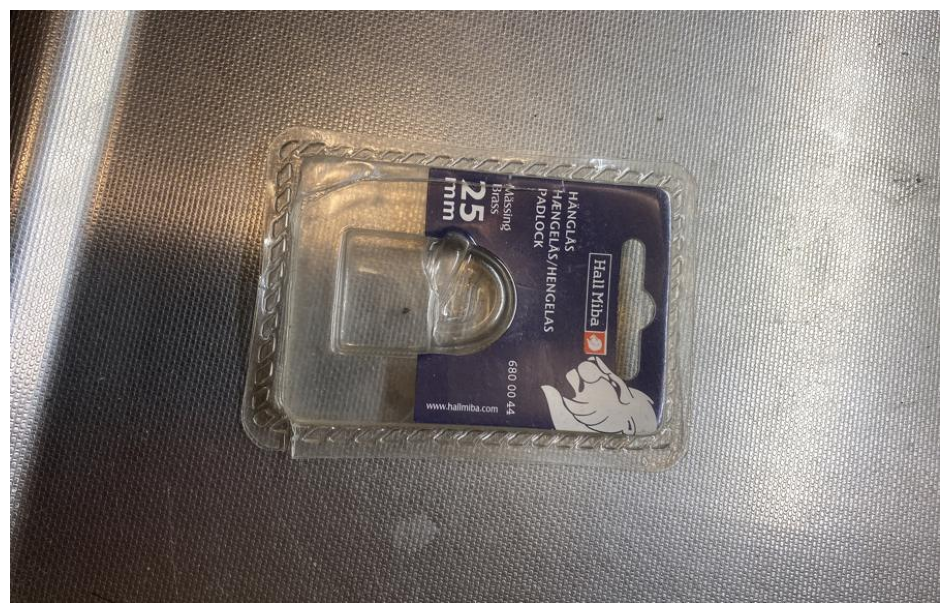

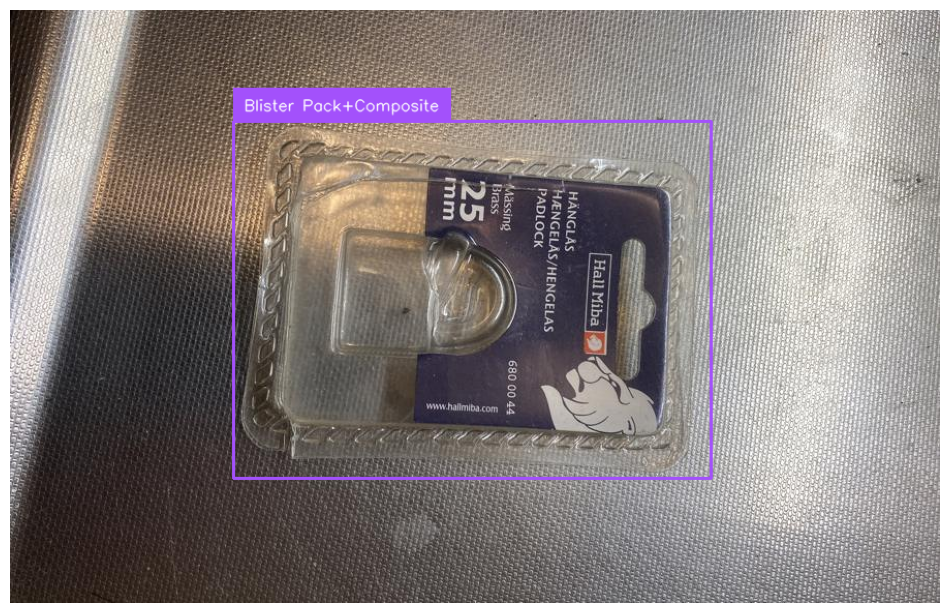

In [39]:

row = df.loc[1358] #1904=paper #1337=blister_pack #1435=can
im = row.image
#im.display()
display(row)
row.image.display()
im.annotate_row(
    df[df["image_id"] == row.image_id], label_col=["object", "material"]
).display()

In [104]:
print(im.shape)

(364, 318)


In [65]:
row

image_id                                       976982799214034297
image           <PIL.JpegImagePlugin.JpegImageFile image mode=...
image_height                                                  574
image_width                                                   900
material                                                Composite
object                                               Blister Pack
x1                                                           36.0
y1                                                           18.0
x2                                                          113.0
y2                                                           75.0
Name: 1337, dtype: object

In [76]:
df = load_images_from_df(df, reduplicate=True)
df

NameError: name 'load_images_from_df' is not defined

In [66]:
load_image(row)

ValueError: One of path, image or url must be set

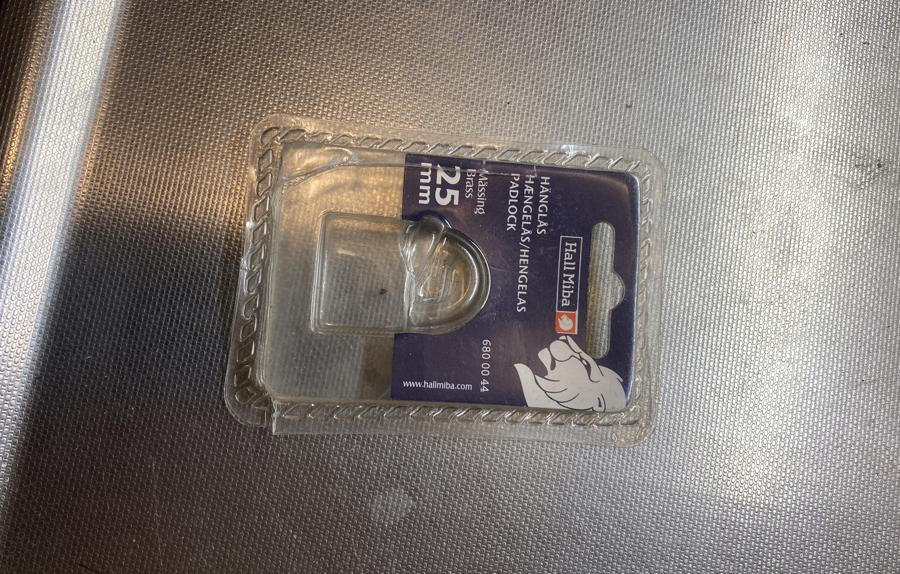

In [53]:
df.loc[1337].image

,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2
1435,2105761973738690856,<PIL.JpegImagePlugin.JpegImageFile image mode=...,900,900,Metal,Can/Tin/Cylinder,284.0,74.0,674.0,780.0


In [101]:
row_test.image

1435    <PIL.JpegImagePlugin.JpegImageFile image mode=...
Name: image, dtype: object

In [ ]:
im.annotate_row(
    df[df["image_id"] == row.image_id], label_col=["object", "material"]
).display()

In [92]:
df_csv = pd.read_csv("../tests/data/images.csv")
df_csv

,image_id,image_source,image_height,image_width,object,material,brand,x1,y1,x2,y2
0,2105761973738690856,https://storage.googleapis.com/seegull-test-da...,900,900,Can/Tin/Cylinder,Metal,old jamaica,284.0,74.0,674.0,780.0
1,357721097128884392,https://storage.googleapis.com/seegull-test-da...,900,900,Box/Card/Tray/Crate,Fiber - Cardboard / Paper Packaging,björn borg,222.0,206.0,633.0,726.0
2,328325079742791550,https://storage.googleapis.com/seegull-test-da...,901,901,Flexibles/Bag/Wrapper/Foil/Net,Plastic - Soft,almo nature,196.0,49.0,710.0,788.0
3,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,666,500,Battery,Hazardous Waste,unknown,263.0,255.0,376.0,305.0
4,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,666,500,Battery,Hazardous Waste,unknown,71.0,248.0,176.0,357.0
5,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,666,500,Battery,Hazardous Waste,unknown,166.0,270.0,265.0,347.0
6,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,666,500,Battery,Hazardous Waste,energizer,286.0,306.0,389.0,384.0
7,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,666,500,Battery,Hazardous Waste,unknown,113.0,299.0,185.0,427.0
8,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,666,500,Battery,Hazardous Waste,unknown,206.0,328.0,298.0,417.0
9,468836346316123269,https://storage.googleapis.com/seegull-test-da...,901,901,Bottle,Plastic - Hard,smarteyes,340.0,35.0,577.0,856.0


In [93]:
df_csv = get_image_df(df_csv, reduplicate=True)
df_csv

loading images:   0%|          | 0/10 [00:00<?, ?it/s]

,image_id,image_source,image,path,exists,image_height,image_width,object,material,brand,x1,y1,x2,y2
0,2105761973738690856,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/f91e3729a5803380ae4947542d8387e74e476ad20...,True,900,900,Can/Tin/Cylinder,Metal,old jamaica,284.0,74.0,674.0,780.0
1,357721097128884392,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ed88b4cb9d6fc07d9443c22702456ed454b5501be...,True,900,900,Box/Card/Tray/Crate,Fiber - Cardboard / Paper Packaging,björn borg,222.0,206.0,633.0,726.0
2,328325079742791550,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/4c44425ff854b00bfc0d0acbe42efca158860f3d0...,True,901,901,Flexibles/Bag/Wrapper/Foil/Net,Plastic - Soft,almo nature,196.0,49.0,710.0,788.0
3,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ade2f6f2d0f5c7d946171da63f2f870c86ddfcb5b...,True,666,500,Battery,Hazardous Waste,unknown,263.0,255.0,376.0,305.0
4,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ade2f6f2d0f5c7d946171da63f2f870c86ddfcb5b...,True,666,500,Battery,Hazardous Waste,unknown,71.0,248.0,176.0,357.0
5,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ade2f6f2d0f5c7d946171da63f2f870c86ddfcb5b...,True,666,500,Battery,Hazardous Waste,unknown,166.0,270.0,265.0,347.0
6,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ade2f6f2d0f5c7d946171da63f2f870c86ddfcb5b...,True,666,500,Battery,Hazardous Waste,energizer,286.0,306.0,389.0,384.0
7,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ade2f6f2d0f5c7d946171da63f2f870c86ddfcb5b...,True,666,500,Battery,Hazardous Waste,unknown,113.0,299.0,185.0,427.0
8,4875697904501717195,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/ade2f6f2d0f5c7d946171da63f2f870c86ddfcb5b...,True,666,500,Battery,Hazardous Waste,unknown,206.0,328.0,298.0,417.0
9,468836346316123269,https://storage.googleapis.com/seegull-test-da...,<seegull.data.image.Image object at 0x7f74d167...,/tmp/c6c50ddd24318e28985cc89385b26e7aa2674386d...,True,901,901,Bottle,Plastic - Hard,smarteyes,340.0,35.0,577.0,856.0


# Run the model on an image

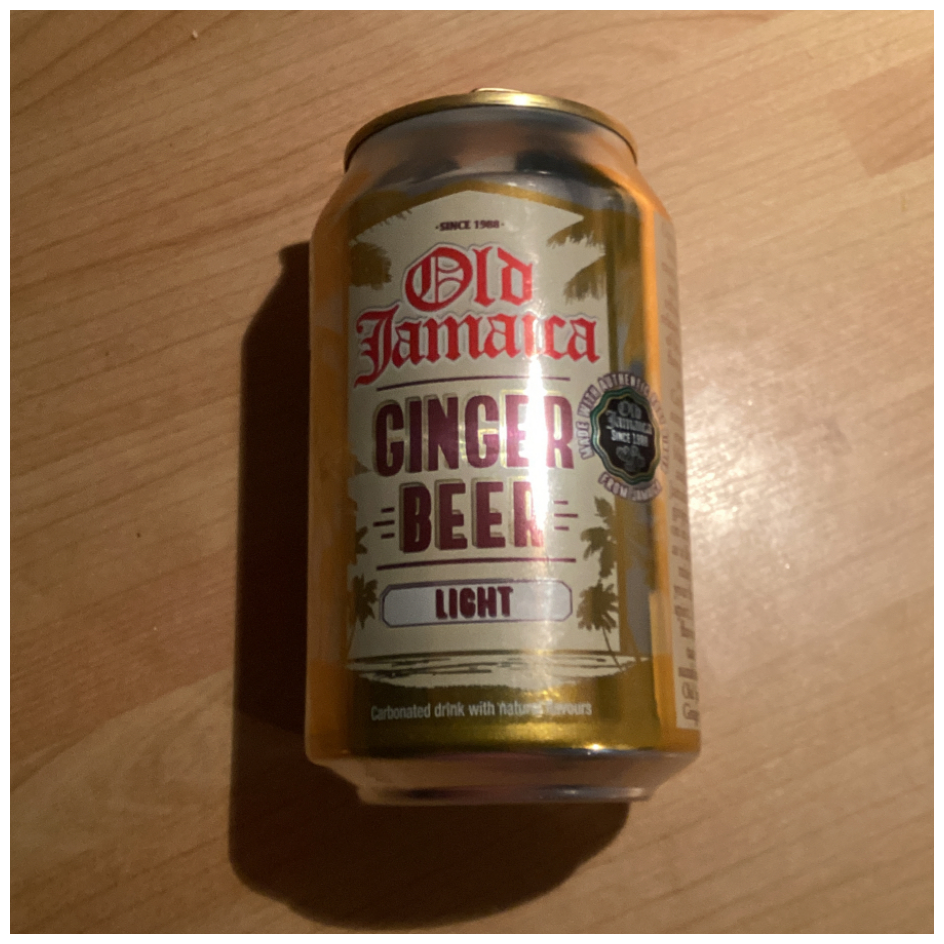

In [129]:
row = df_csv.iloc[0]
im = row.image
im.display()

In [130]:
row

image_id                                      2105761973738690856
image_source    https://storage.googleapis.com/seegull-test-da...
image           <seegull.data.image.Image object at 0x7f74d167...
path            /tmp/f91e3729a5803380ae4947542d8387e74e476ad20...
exists                                                       True
image_height                                                  900
image_width                                                   900
object                                           Can/Tin/Cylinder
material                                                    Metal
brand                                                 old jamaica
x1                                                          284.0
y1                                                           74.0
x2                                                          674.0
y2                                                          780.0
Name: 0, dtype: object

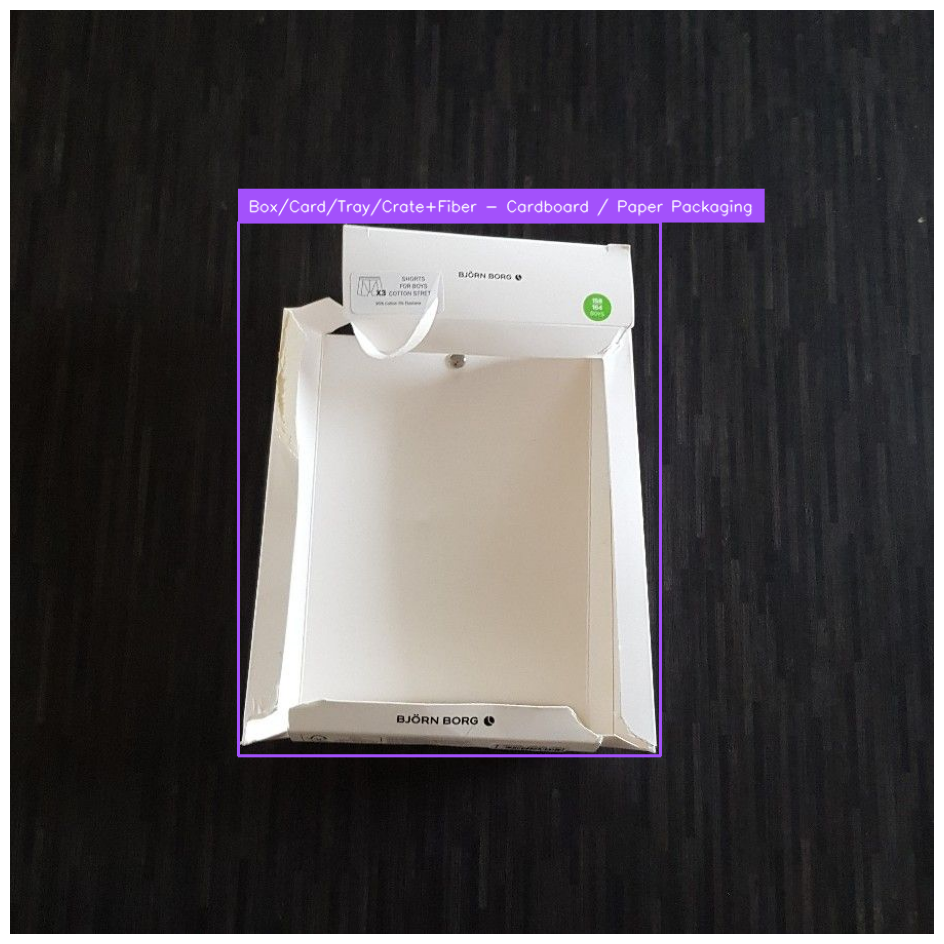

In [97]:
# Display the ground truth annotations from the dataframe
im.annotate_row(
    df_csv[df_csv["image_id"] == row.image_id], label_col=["object", "material"]
).display()

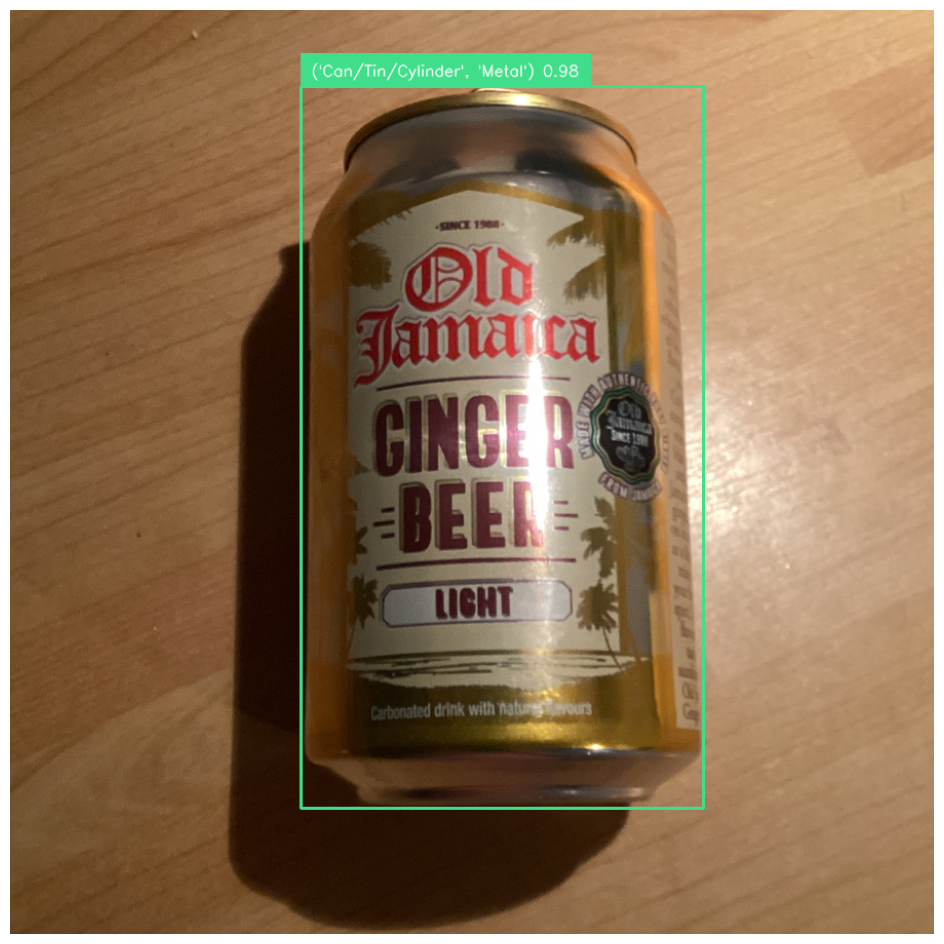

In [26]:
# Display the predicted bounding box
im.predict(model).annotate().display()

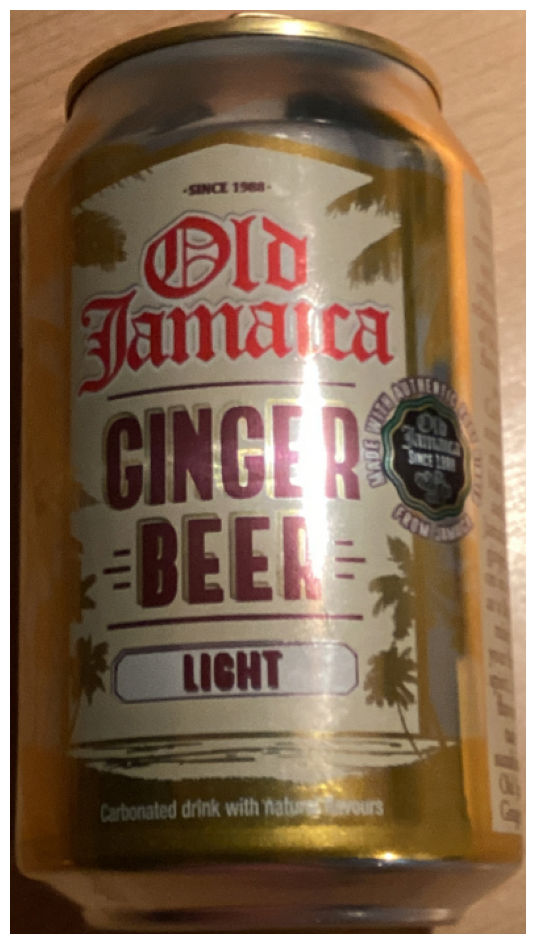

In [34]:
# Crop to just the prediction
im.predict(model).crop().display()

0.9610274


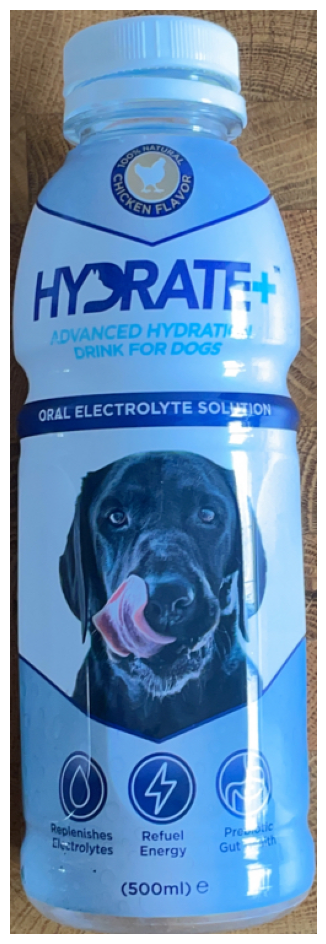

0.37332934


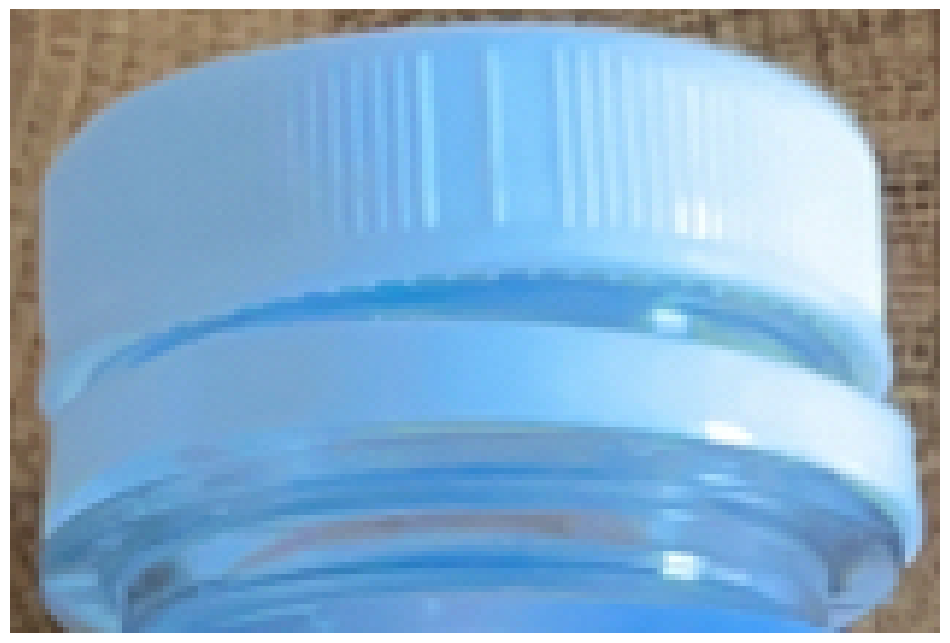

In [38]:
# Get multiple crops from an image
row = df[df["image_id"] == 225696838630806860].iloc[0]
im = row.image
for xyxy, conf, class_id, crop in im.predict(
    model, conf=0.25
).detection_crops():
    print(conf)
    crop.display()

In [41]:
df

,image_id,image,image_height,image_width,material,object,x1,y1,x2,y2
0,3858098582085160810,<seegull.data.image.Image object at 0x7f03bfc3...,750,900,Electronic Waste,E-cigarette,199.000000,406.000000,648.000000,487.000000
1,473219887982654032,<seegull.data.image.Image object at 0x7f03bff8...,900,900,Plastic - Hard,Cosmetics Containers,368.000000,0.000000,500.000000,731.000000
2,213318524120860226,<seegull.data.image.Image object at 0x7f01f015...,900,900,Textiles,None,245.000000,301.000000,685.000000,673.000000
3,461249427308373244,<seegull.data.image.Image object at 0x7f01f015...,900,900,Composite,None,98.000000,321.000000,672.000000,495.000000
4,300921795038673201,<seegull.data.image.Image object at 0x7f01f015...,901,901,Plastic - Hard,None,501.000000,557.000000,854.000000,800.000000
...,...,...,...,...,...,...,...,...,...,...
2541,423807678920865596,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,90.000000,278.000000,847.000000,620.000000
2542,6639930932243921958,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,275.000000,98.000000,668.000000,765.000000
2543,127714150322412580,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,217.000000,87.000000,672.000000,673.000000
2544,2179530693265365615,<seegull.data.image.Image object at 0x7f03bfc1...,900,900,Plastic - Soft,Flexibles/Bag/Wrapper/Foil/Net,15.210449,1.283478,857.531555,848.527222


# Validation

In [40]:
val = model.validate(df=df, split=None, target=["object", "material"])

/opt/conda/lib/python3.10/site-packages/seegull/data/image.py:619: TqdmWarning: Iterable length 1578 > 1000 but `chunksize` is not set. This may seriously degrade multiprocess performance. Set `chunksize=1` or more.
  images = process_map(


loading images:   0%|          | 0/1578 [00:00<?, ?it/s]

ValueError: One of path, image, url, or pil_image must be set

In [28]:
val.metrics_per_class()

,object,material,precision,recall,f1,count
0,Aerosol,Metal,0.000000,0.000000,0.000000,1.0
1,Battery,Hazardous Waste,1.000000,0.090909,0.166667,11.0
2,Bottle,Plastic - Hard,1.000000,0.500000,0.666667,2.0
3,Box/Card/Tray/Crate,Fiber - Cardboard / Paper Packaging,1.000000,1.000000,1.000000,2.0
4,Can/Tin/Cylinder,Metal,1.000000,1.000000,1.000000,1.0
5,Flexibles/Bag/Wrapper/Foil/Net,Plastic - Soft,1.000000,1.000000,1.000000,2.0
6,Lid/Cap,Composite,0.000000,0.000000,0.000000,1.0
7,Lid/Cap,Plastic - Hard,0.000000,0.000000,0.000000,2.0
0,MEAN,MEAN,0.625000,0.448864,0.479167,22.0
0,WEIGHTED MEAN,WEIGHTED MEAN,0.818182,0.318182,0.371212,22.0


468836346316123269


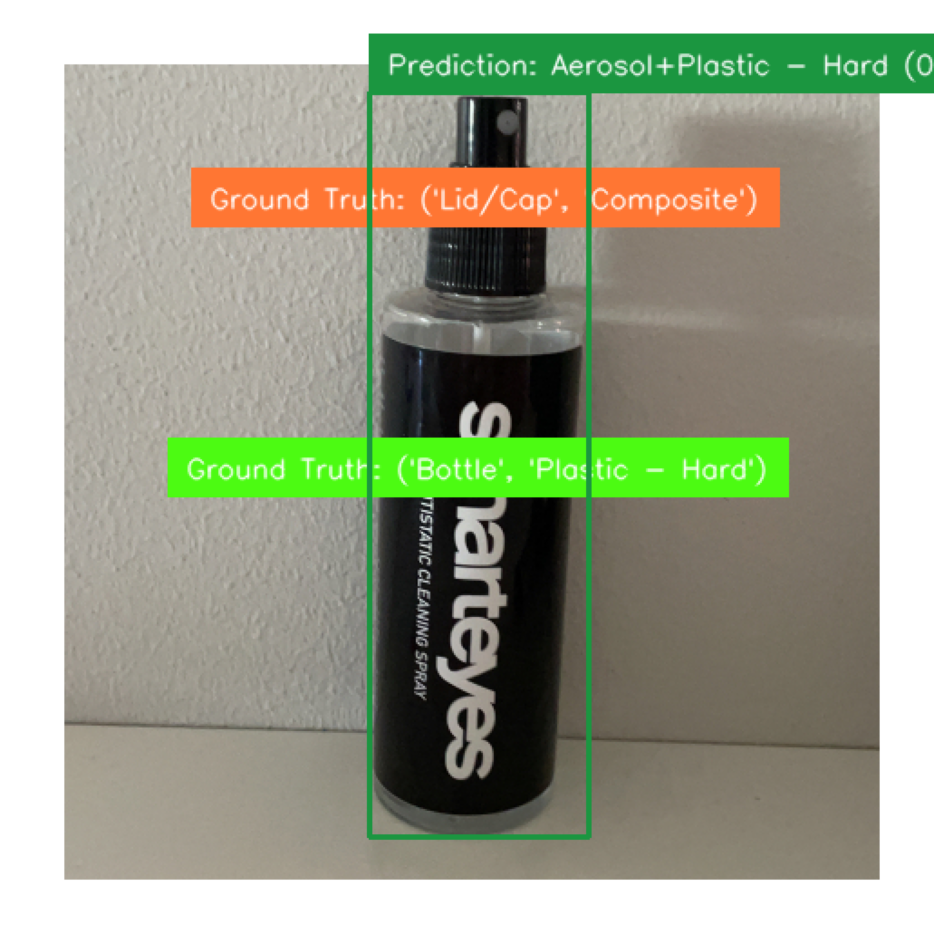

In [32]:
val.display_discrepencies(limit=1, image_ids=[468836346316123269])

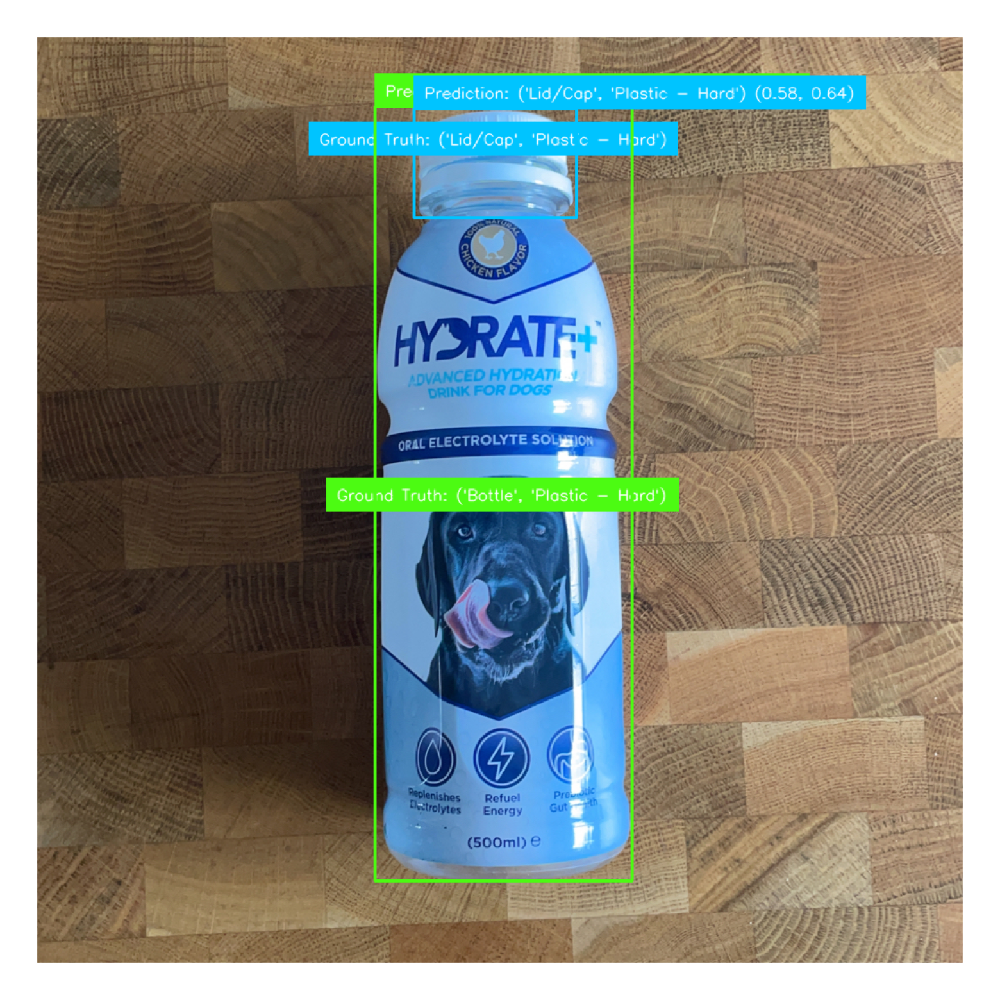

In [31]:
val.plot_image_by_id(225696838630806860, size=(20, 20), resize=None)